In [2]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

df = pd.read_excel("energy_consumption.xlsx", skiprows=1)
keep_cols = [c for c in df.columns if c in ("season", "hour") or c.startswith("N")]
df = df[keep_cols]

In [3]:
df.head()

,season,hour,N0000,N0001,N0007,N1002,N1003,N2004,N2008,N2009,...,N7006,N7008,N7010,N7012,N8000,N8005,N8008,N8010,N8012,N8014
0,1,1,54.793634,437.206366,338,193,444,13.845182,59.019614,177.058842,...,103.892529,147.388728,250.295432,188.427113,380.110449,70.546589,375.453411,138.303997,32.696003,18.889551
1,1,2,54.633574,436.366426,284,171,423,13.845182,47.999345,143.998036,...,103.892529,139.011382,240.907289,169.817401,408.110449,61.732389,336.267611,120.510501,28.489499,18.889551
2,1,3,46.310471,392.689529,258,154,407,13.845182,46.525705,139.577114,...,103.892529,139.395881,245.160111,164.431176,349.110449,54.203593,302.796407,111.613752,26.386248,18.889551
3,1,4,40.068143,359.931857,251,144,402,13.845182,43.386210,130.158629,...,103.892529,136.293084,239.500098,161.102609,364.110449,53.285447,298.714553,109.187366,25.812634,18.889551
4,1,5,39.107785,354.892215,255,141,407,13.845182,40.951499,122.854497,...,103.892529,140.488233,255.487350,151.994442,357.110449,50.714639,287.285361,104.334594,24.665406,18.889551


Делим датасет на зимние и летние суточные наблюдения.

In [4]:
summer = df[df["season"] == 1].reset_index(drop=True)
winter = df[df["season"] == 2].reset_index(drop=True)

In [5]:
def split_into_days(df_period, prefix):
    station_cols = [c for c in df_period.columns if c not in ("season", "hour")]
    
    days_count = len(df_period) // 24
    
    result = pd.DataFrame({"hour": range(1, 25)})
    
    for col in station_cols:
        for day in range(days_count):
            block = df_period.iloc[day*24:(day+1)*24][col].reset_index(drop=True)
            new_col = f"{col}_{prefix}_day{day+1}"
            result[new_col] = block
    
    return result

In [6]:
summer_days = split_into_days(summer, "summer")
winter_days = split_into_days(winter, "winter")

In [7]:
summer_days.head()

,hour,N0000_summer_day1,N0000_summer_day2,N0000_summer_day3,N0000_summer_day4,N0000_summer_day5,N0000_summer_day6,N0000_summer_day7,N0001_summer_day1,N0001_summer_day2,...,N8012_summer_day5,N8012_summer_day6,N8012_summer_day7,N8014_summer_day1,N8014_summer_day2,N8014_summer_day3,N8014_summer_day4,N8014_summer_day5,N8014_summer_day6,N8014_summer_day7
0,1,54.793634,61.196021,61.516141,62.476499,63.116738,61.196021,60.555783,437.206366,470.803979,...,30.019137,29.445523,32.887207,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551
1,2,54.633574,56.074111,86.005273,51.912560,53.513157,52.552798,52.232679,436.366426,443.925889,...,26.003838,25.239020,28.680704,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551
2,3,46.310471,48.231187,78.962647,48.711366,50.311963,39.427904,45.830292,392.689529,402.768813,...,24.091791,23.135768,26.959862,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551
3,4,40.068143,45.990351,79.442826,52.072619,46.790650,47.270829,44.389754,359.931857,391.009649,...,23.135768,22.179744,26.195043,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551
4,5,39.107785,41.988859,86.485452,40.548322,42.789158,40.868441,47.590948,354.892215,370.011141,...,22.370949,21.797335,25.047815,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551,18.889551


Кластеризация летних данных

In [10]:
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN
from sklearn.metrics import silhouette_score

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

In [11]:
data = summer_days.drop(columns=["hour"])
X = data.T
X.head()

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
N0000_summer_day1,54.793634,54.633574,46.310471,40.068143,39.107785,40.708382,44.389754,40.388262,48.071127,56.074111,...,66.477991,69.679185,69.199006,69.038946,69.679185,68.878886,68.718827,65.997812,75.281274,65.837752
N0000_summer_day2,61.196021,56.074111,48.231187,45.990351,41.988859,44.069635,36.066651,44.549814,54.953694,61.356081,...,61.196021,67.918528,65.997812,68.878886,68.398707,60.715842,65.677693,69.199006,98.329869,71.279782
N0000_summer_day3,61.516141,86.005273,78.962647,79.442826,86.485452,100.250585,114.175778,51.912560,51.592440,54.953694,...,62.476499,70.799603,65.037454,66.638051,71.759961,65.677693,61.035962,67.278290,72.880379,67.598409
N0000_summer_day4,62.476499,51.912560,48.711366,52.072619,40.548322,38.307486,40.388262,42.308978,51.112261,64.077096,...,64.877394,66.157872,69.519125,65.677693,70.959662,71.599901,65.677693,68.398707,74.480975,70.479483
N0000_summer_day5,63.116738,53.513157,50.311963,46.790650,42.789158,36.386770,38.627606,49.511664,52.712858,59.435365,...,68.238648,71.759961,69.839245,69.359065,66.958170,69.839245,63.436857,65.197514,72.240140,75.441334


In [ ]:
def plot_ts_clusters_on_one_figure(X, labels, title="Кластеризация"):
    unique_clusters = np.unique(labels)
    colors = ["blue", "red", "green", "purple", "orange"]

    plt.figure(figsize=(12, 5))

    for i, cluster in enumerate(unique_clusters):
        cluster_color = colors[i % len(colors)]

        for row in X[labels == cluster]:
            plt.plot(row, color=cluster_color, alpha=0.1)

        mean_profile = X[labels == cluster].mean(axis=0)
        plt.plot(mean_profile, color=cluster_color, linewidth=3,
                 label=f"Профиль {cluster} кластера")

    plt.title(title)
    plt.xlabel("Время")
    plt.ylabel("Значение")
    plt.legend()
    plt.grid(True)
    plt.show()

In [13]:
mask_const = (X.max(axis=1) == X.min(axis=1))
print("Константных рядов найдено:", mask_const.sum())
X_clean = X.loc[~mask_const].copy()

Константных рядов найдено: 21


In [14]:
X = X_clean.values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

Иерархическая кластеризация

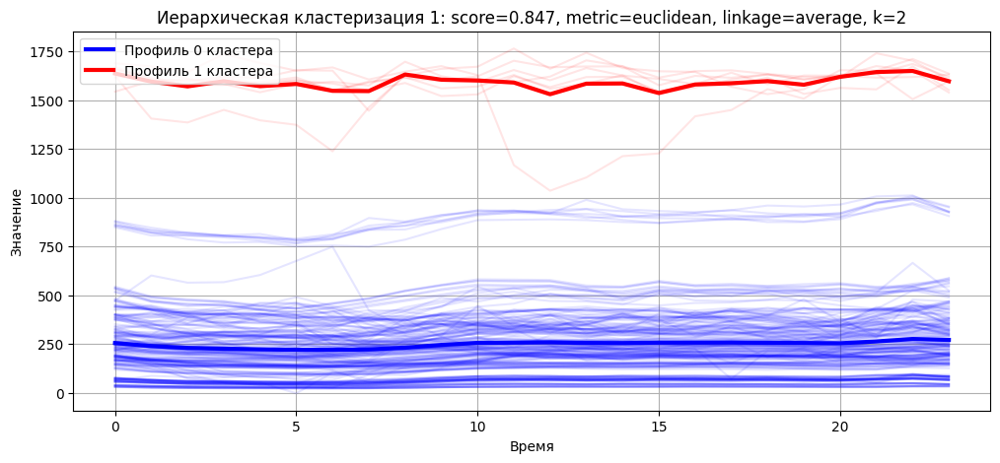

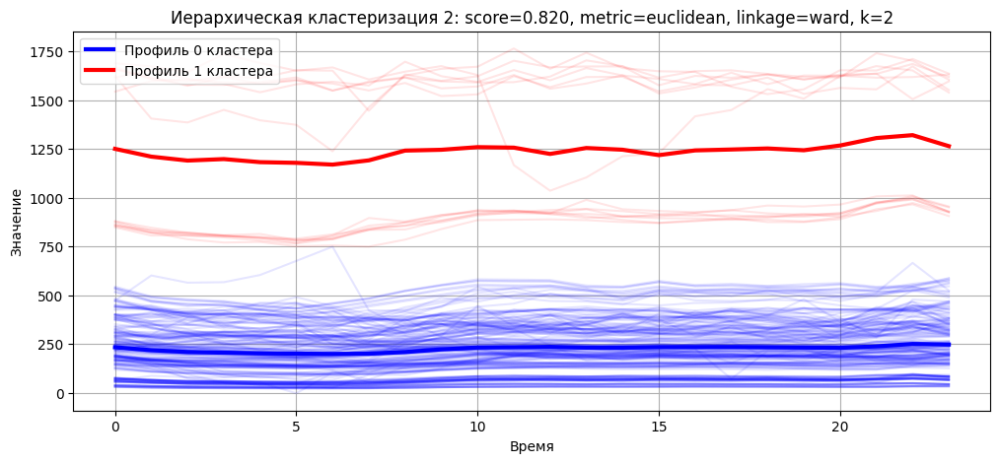

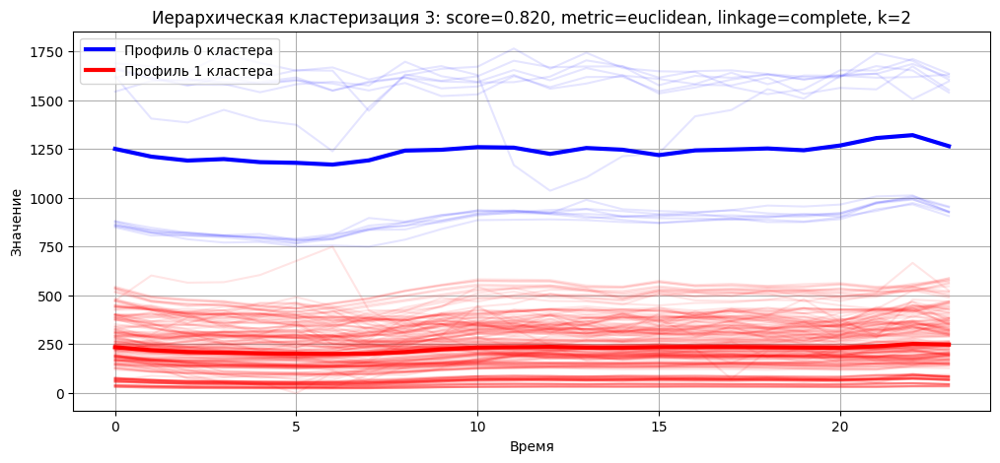

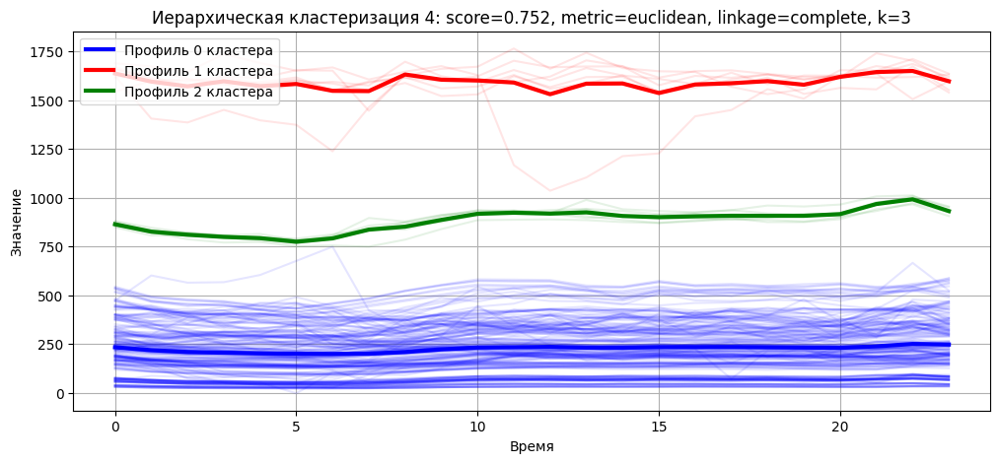

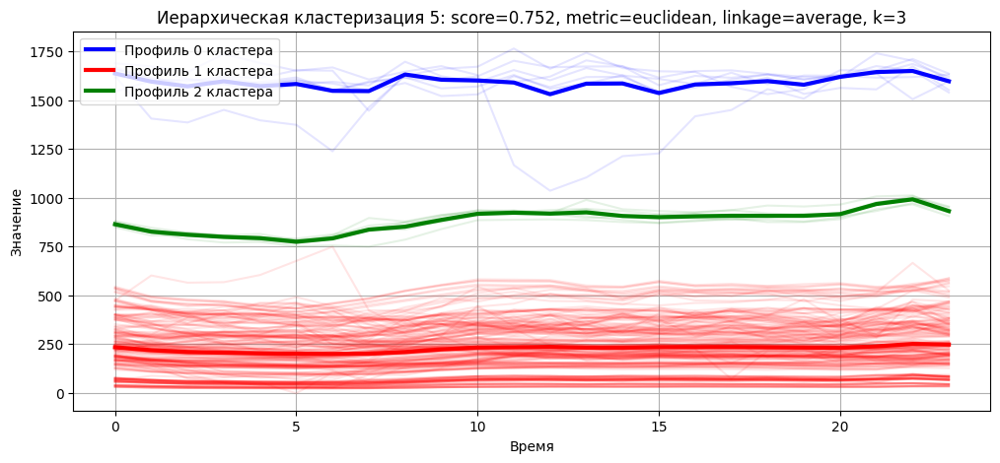

...

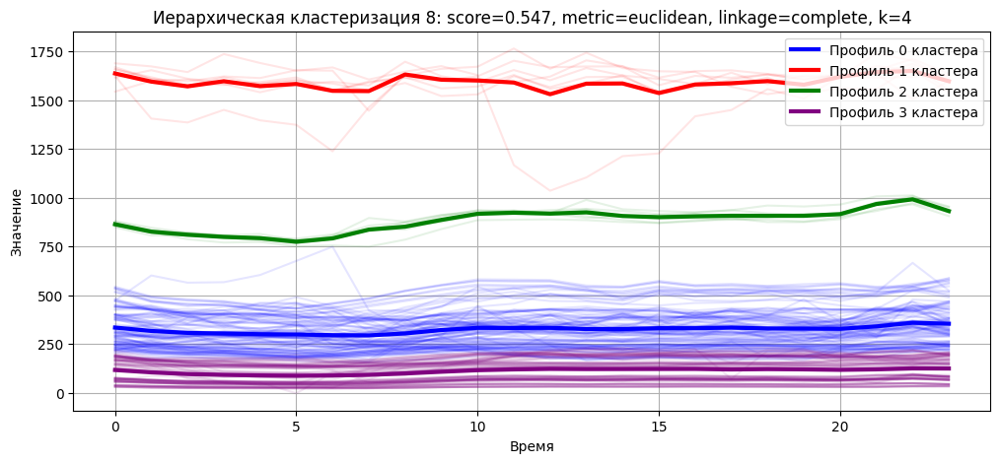

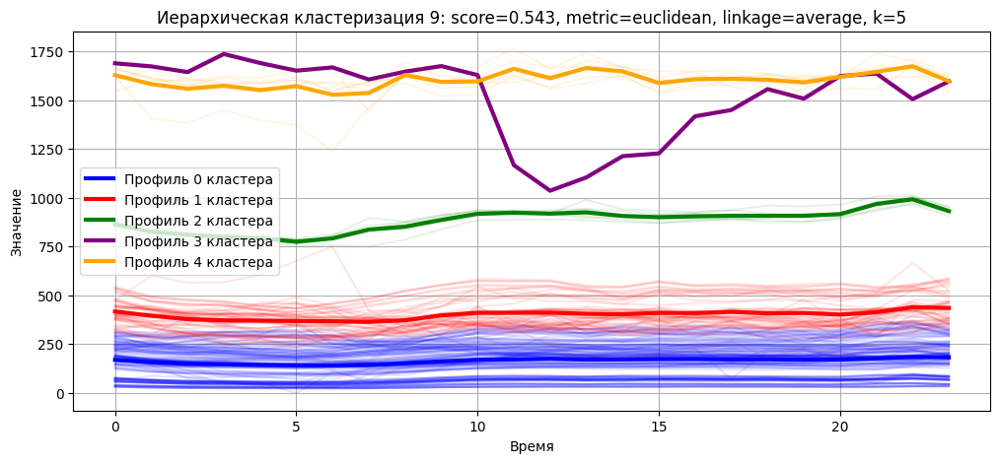

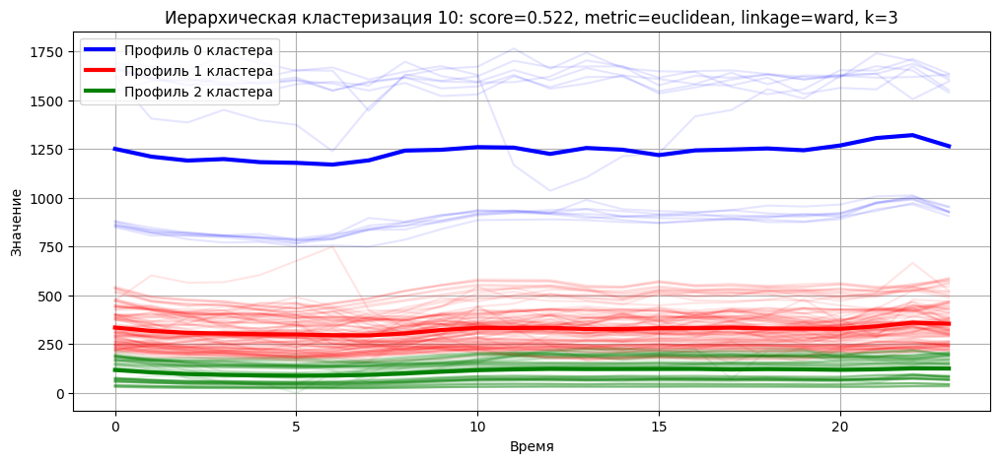

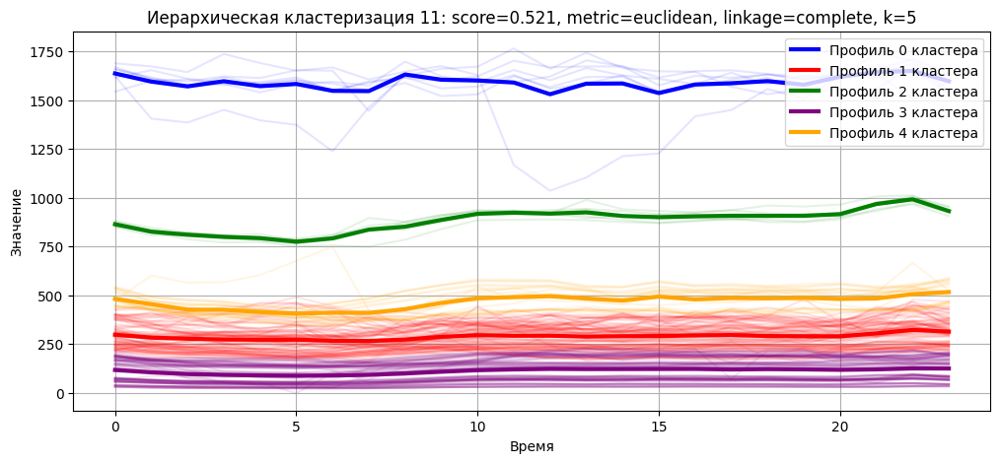

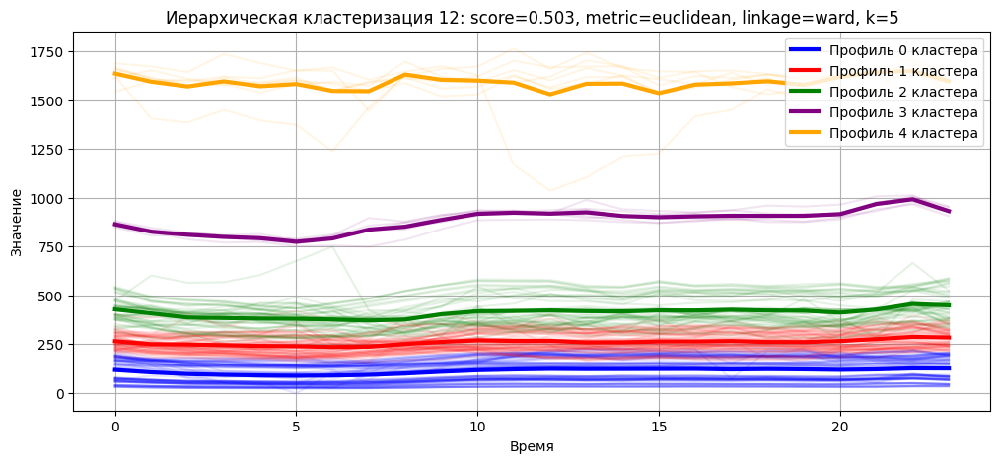

,params,silhouette,cluster_0_size,cluster_1_size,cluster_2_size,cluster_3_size,cluster_4_size
0,"metric=euclidean, linkage=average, k=2",0.846828,203,7,NaN,NaN,NaN
1,"metric=euclidean, linkage=ward, k=2",0.819981,196,14,NaN,NaN,NaN
2,"metric=euclidean, linkage=complete, k=2",0.819981,14,196,NaN,NaN,NaN
3,"metric=euclidean, linkage=complete, k=3",0.752210,196,7,7.0,NaN,NaN
4,"metric=euclidean, linkage=average, k=3",0.752210,7,196,7.0,NaN,NaN


In [16]:
results_agg = []

metrics = ["euclidean"]
linkages = ["ward", "complete", "average"]
k_list = [2, 3, 4, 5]

for metric in metrics:
    for linkage in linkages:

        # Ограничение: ward работает только с евклидовой метрикой
        if linkage == "ward" and metric != "euclidean":
            continue

        for k in k_list:
            try:
                model = AgglomerativeClustering(
                    n_clusters=k,
                    metric=metric,
                    linkage=linkage
                )

                labels = model.fit_predict(X)

                if len(np.unique(labels)) < 2:
                    continue

                score = silhouette_score(X, labels)
                results_agg.append((score, metric, linkage, k, labels))

            except:
                pass

results_agg_sorted = sorted(results_agg, key=lambda x: -x[0])

rows = []

for score, metric, linkage, k, labels in results_agg_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{int(u)}_size": int(c) for u, c in zip(unique, counts)}

    params = f"metric={metric}, linkage={linkage}, k={k}"

    row = {
        "params": params,
        "silhouette": score
    }
    row.update(count_dict)

    rows.append(row)

for i, (score, metric, linkage, k, labels) in enumerate(results_agg_sorted):
    title = f"Иерархическая кластеризация {i+1}: score={score:.3f}, metric={metric}, linkage={linkage}, k={k}"
    plot_ts_clusters_on_one_figure(X, labels, title)
    
df_agg = pd.DataFrame(rows)
df_agg.head(5)


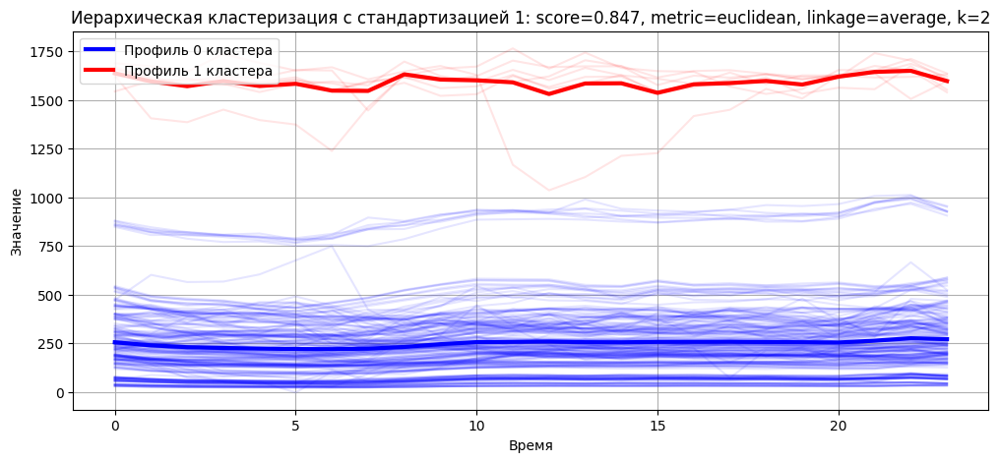

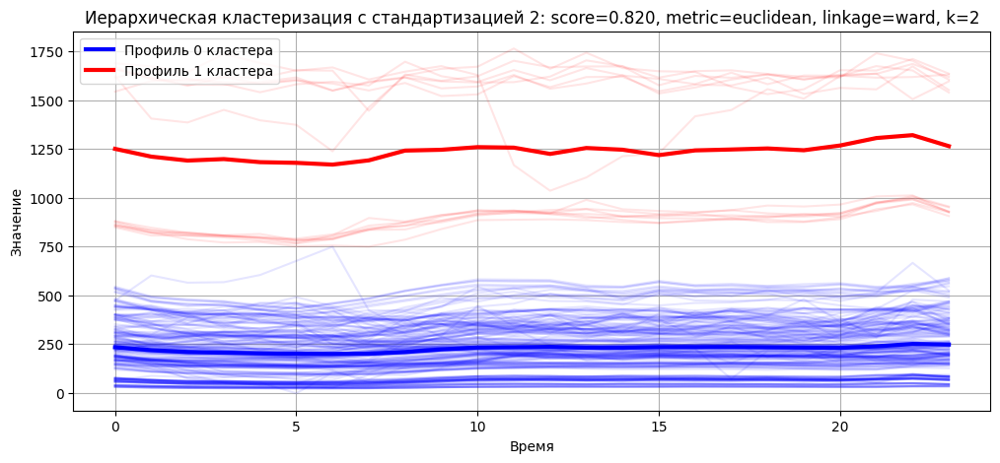

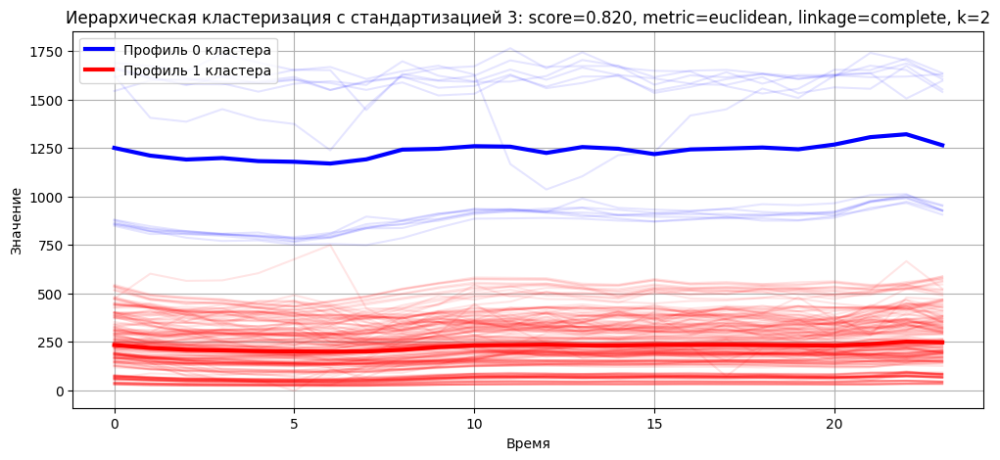

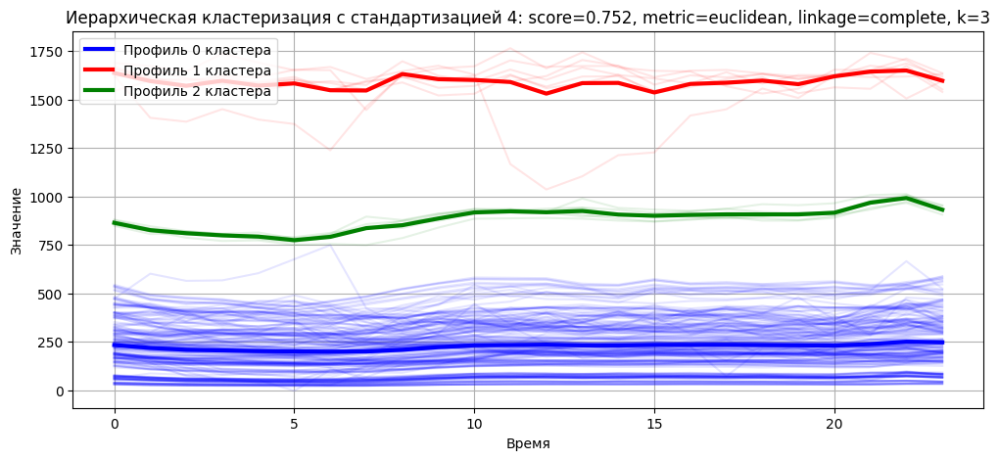

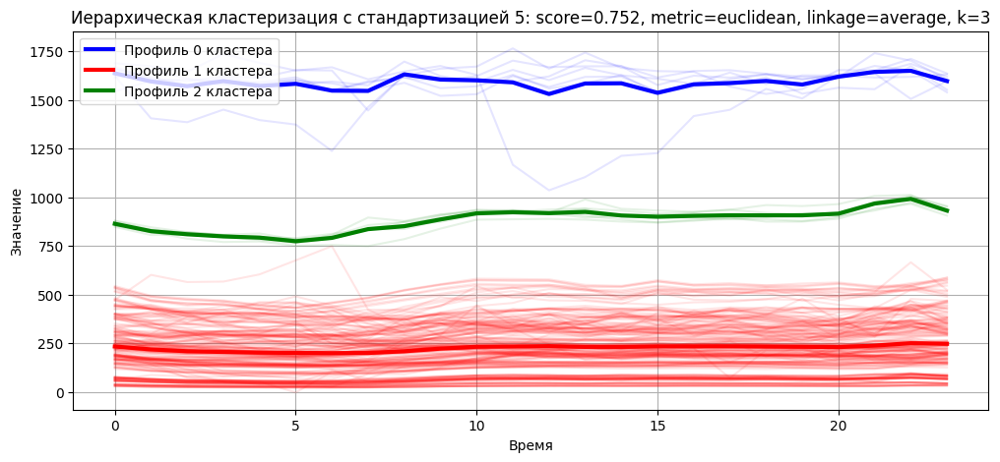

...

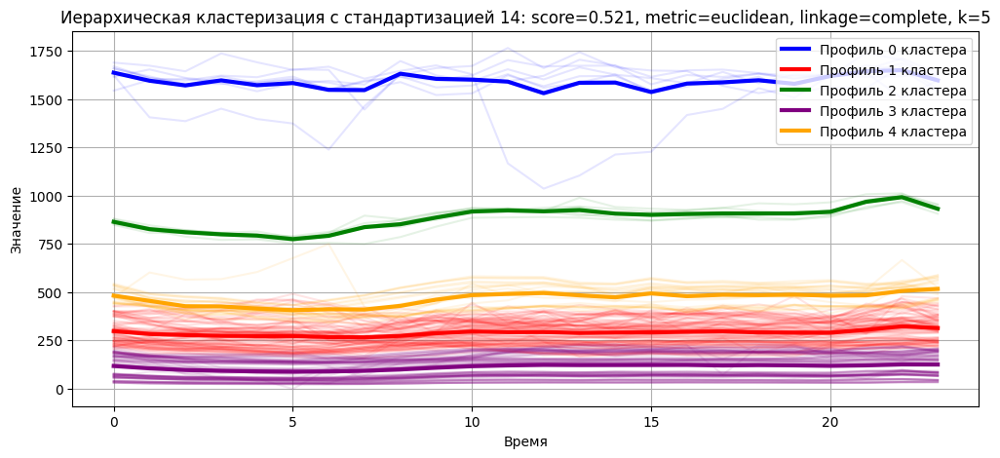

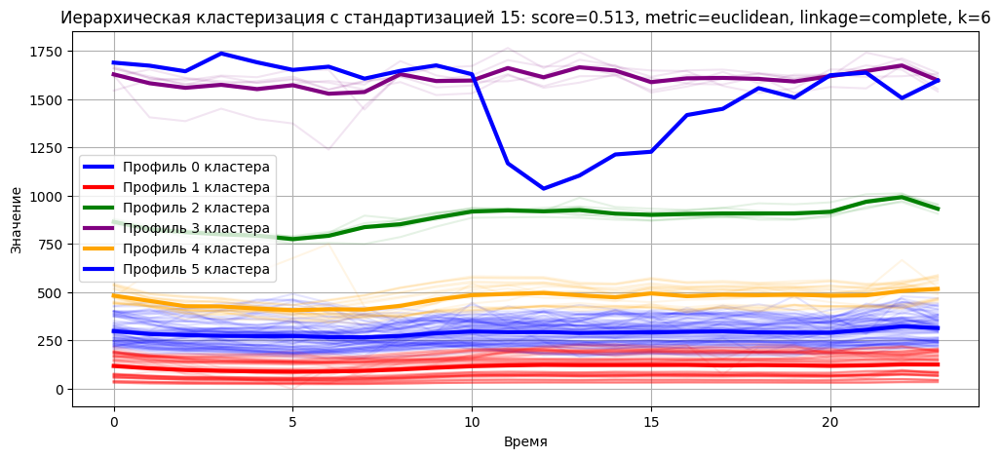

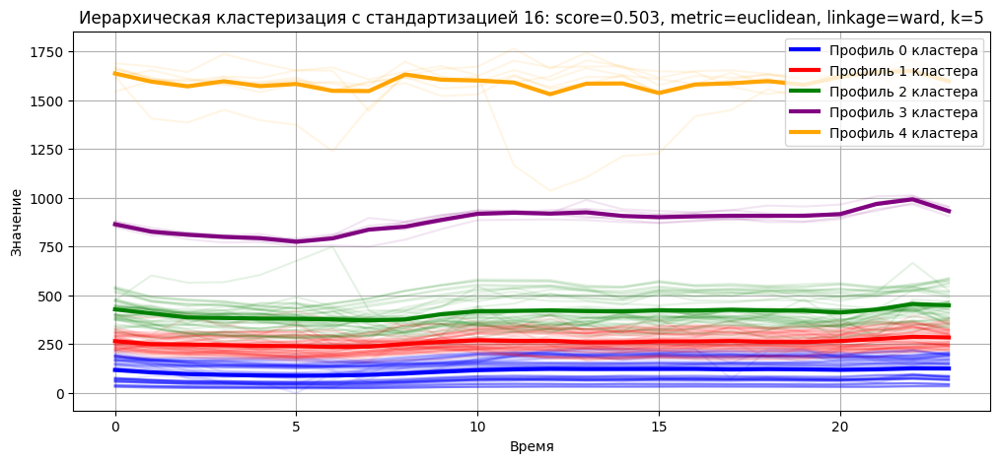

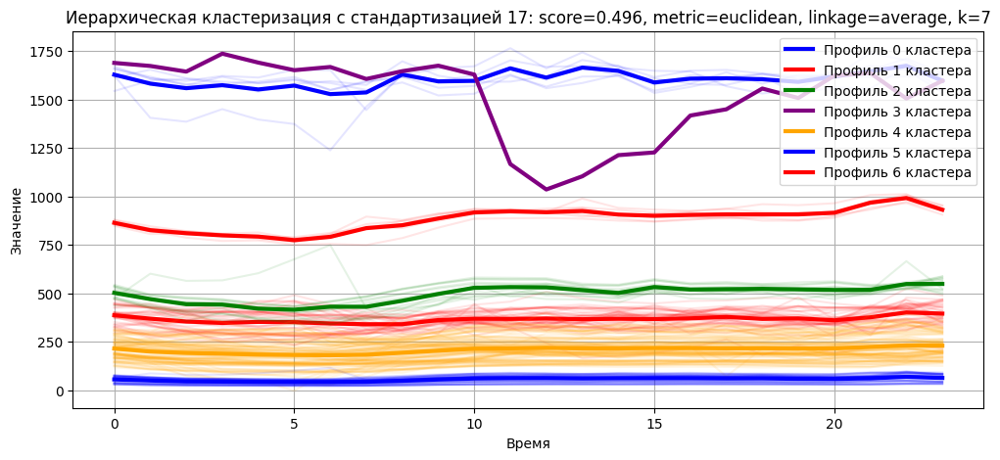

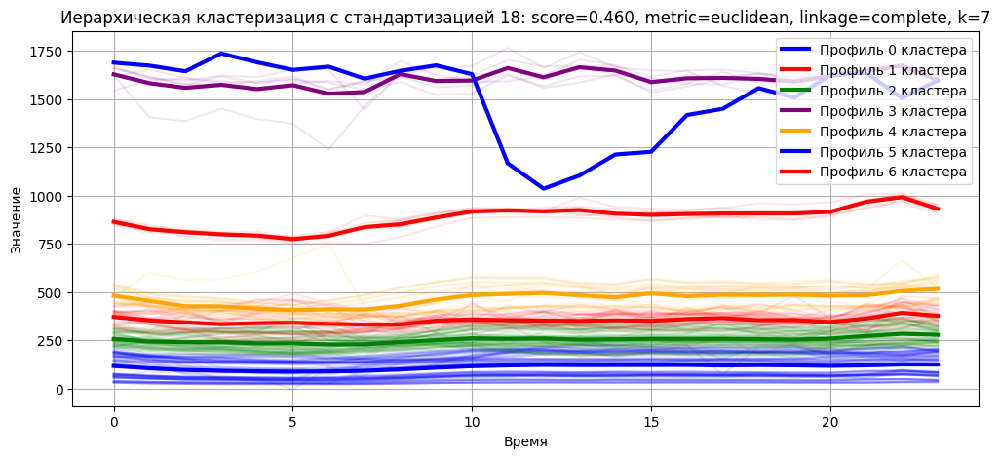

,params,silhouette,cluster_0_size,cluster_1_size,cluster_2_size,cluster_3_size,cluster_4_size,cluster_5_size,cluster_6_size
0,"metric=euclidean, linkage=average, k=2",0.846934,203,7,NaN,NaN,NaN,NaN,NaN
1,"metric=euclidean, linkage=ward, k=2",0.819881,196,14,NaN,NaN,NaN,NaN,NaN
2,"metric=euclidean, linkage=complete, k=2",0.819881,14,196,NaN,NaN,NaN,NaN,NaN
3,"metric=euclidean, linkage=complete, k=3",0.751903,196,7,7.0,NaN,NaN,NaN,NaN
4,"metric=euclidean, linkage=average, k=3",0.751903,7,196,7.0,NaN,NaN,NaN,NaN


In [19]:
results_agg = []

metrics = ["euclidean"]
linkages = ["ward", "complete", "average"]
k_list = [2, 3, 4, 5, 6, 7]

for metric in metrics:
    for linkage in linkages:

        # Ограничение: ward работает только с евклидовой метрикой
        if linkage == "ward" and metric != "euclidean":
            continue

        for k in k_list:
            try:
                model = AgglomerativeClustering(
                    n_clusters=k,
                    metric=metric,
                    linkage=linkage
                )

                labels = model.fit_predict(X_scaled)

                if len(np.unique(labels)) < 2:
                    continue

                score = silhouette_score(X_scaled, labels)
                results_agg.append((score, metric, linkage, k, labels))

            except:
                pass

results_agg_sorted = sorted(results_agg, key=lambda x: -x[0])

rows = []

for score, metric, linkage, k, labels in results_agg_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{int(u)}_size": int(c) for u, c in zip(unique, counts)}

    params = f"metric={metric}, linkage={linkage}, k={k}"

    row = {
        "params": params,
        "silhouette": score
    }
    row.update(count_dict)

    rows.append(row)

for i, (score, metric, linkage, k, labels) in enumerate(results_agg_sorted):
    title = f"Иерархическая кластеризация с стандартизацией {i+1}: score={score:.3f}, metric={metric}, linkage={linkage}, k={k}"
    plot_ts_clusters_on_one_figure(X, labels, title)
    
df_agg = pd.DataFrame(rows)
df_agg.head(5)

Иерархическая кластеризация:
- Не изменилась после стандартизации. 
- В основном обнаружила 2 кластера.
- Высокий silhouette > 0.8.

- Если опираться на 2D проекцию, то кластеризация с максимальным силуэтом разделила только самые отдаленные кластеры.
- Кластеризация с силуэтом 0.5 кажется более информативной.

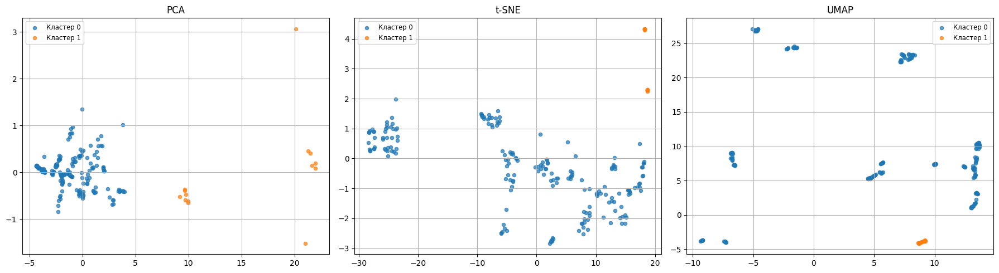

In [20]:
chosen_index = 2
i = chosen_index - 1
score, metric, linkage, k, chosen_labels = results_agg_sorted[i]
chosen_meta = {"method": "Agglomerative", "score": score, "metric": metric, "linkage": linkage, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels})

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()

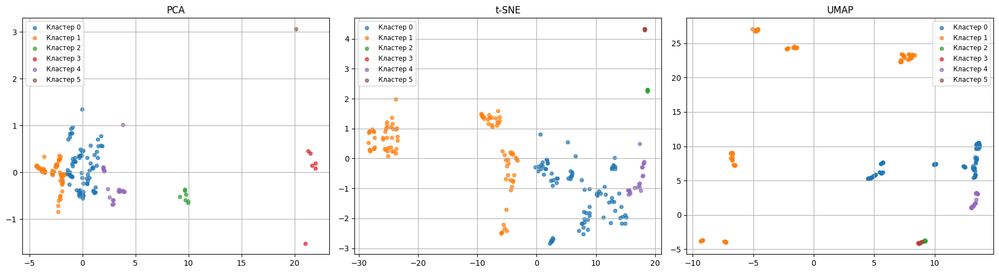

0.5129761412933902


In [21]:
chosen_index = 15
i = chosen_index - 1
score, metric, linkage, k, chosen_labels = results_agg_sorted[i]
chosen_meta = {"method": "Agglomerative", "score": score, "metric": metric, "linkage": linkage, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels})

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()
print(score)

K-means

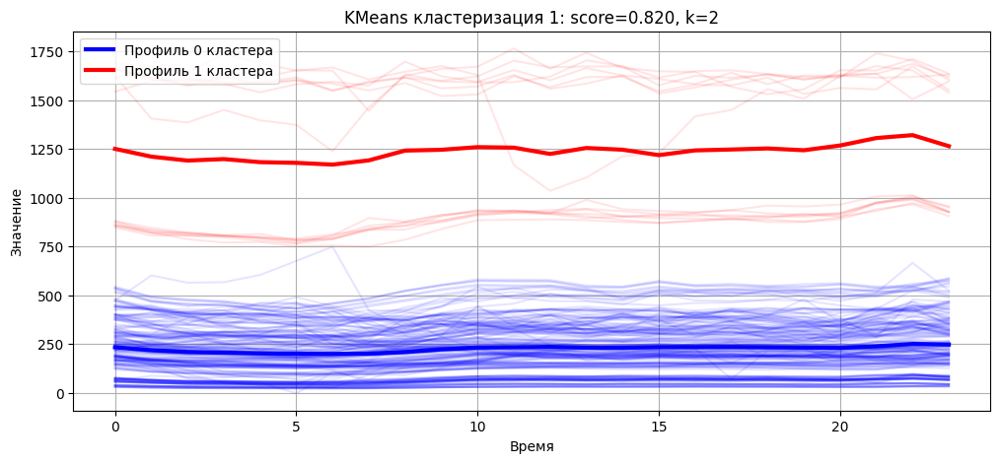

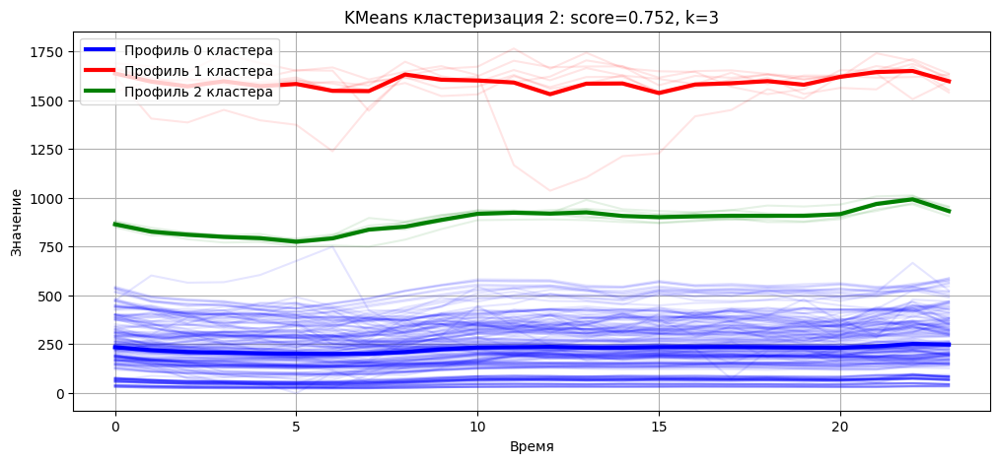

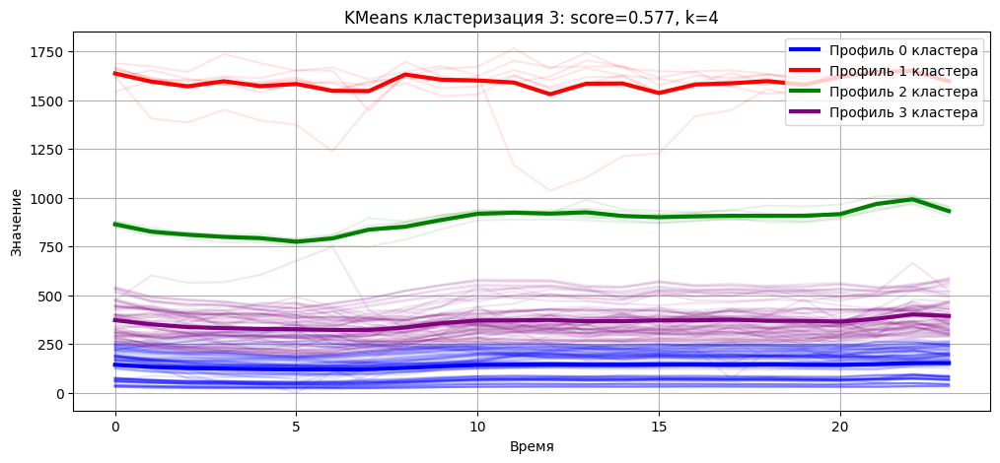

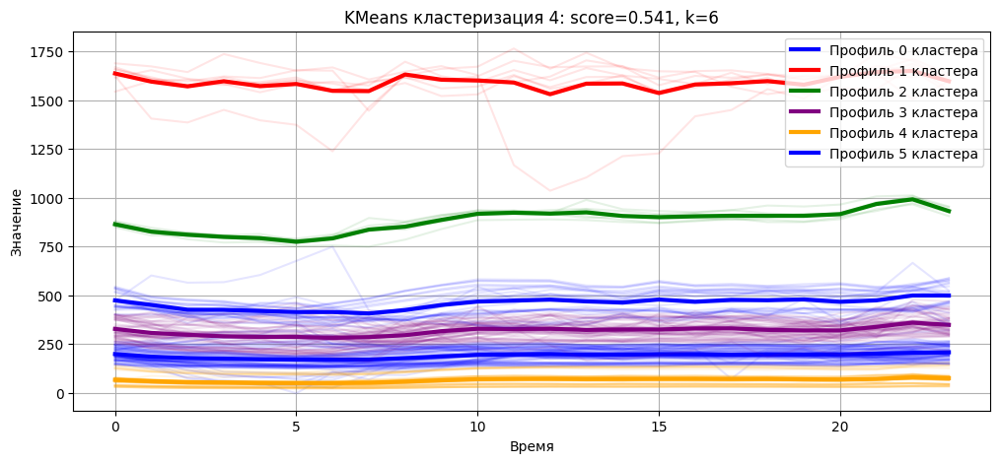

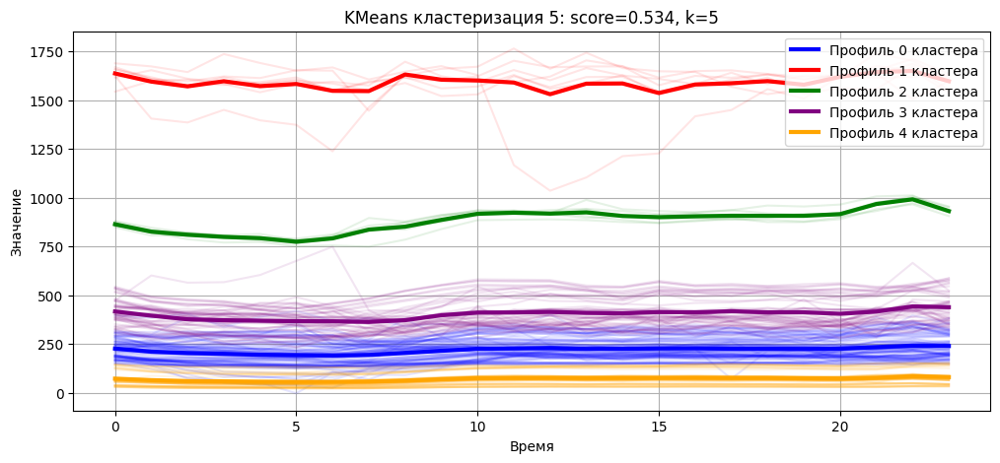

,params,silhouette,cluster_0_size,cluster_1_size,cluster_2_size,cluster_3_size,cluster_4_size,cluster_5_size
0,k=2,0.819981,196,14,NaN,NaN,NaN,NaN
1,k=3,0.752210,196,7,7.0,NaN,NaN,NaN
2,k=4,0.577034,119,7,7.0,77.0,NaN,NaN
3,k=6,0.540709,71,7,7.0,52.0,49.0,24.0
4,k=5,0.534137,93,7,7.0,50.0,53.0,NaN


In [22]:
from sklearn.cluster import KMeans

results_kmeans = []
k_list = [2, 3, 4, 5, 6]

for k in k_list:
    model = KMeans(n_clusters=k, random_state=0)
    labels = model.fit_predict(X)

    score = silhouette_score(X, labels)
    results_kmeans.append((score, k, labels))

results_kmeans_sorted = sorted(results_kmeans, key=lambda x: -x[0])

rows = []

for score, k, labels in results_kmeans_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{u}_size": int(c) for u, c in zip(unique, counts)}

    row = {
        "params": f"k={k}",
        "silhouette": score
    }
    row.update(count_dict)

    rows.append(row)

df_kmeans = pd.DataFrame(rows)

for i, (score, k, labels) in enumerate(results_kmeans_sorted[:5]):
    title = f"KMeans кластеризация {i+1}: score={score:.3f}, k={k}"
    plot_ts_clusters_on_one_figure(X, labels, title)

df_kmeans.head(5)


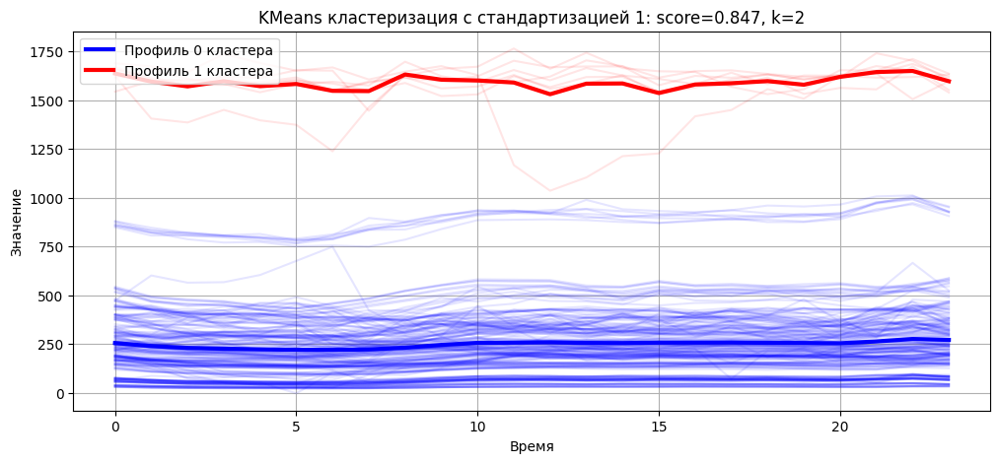

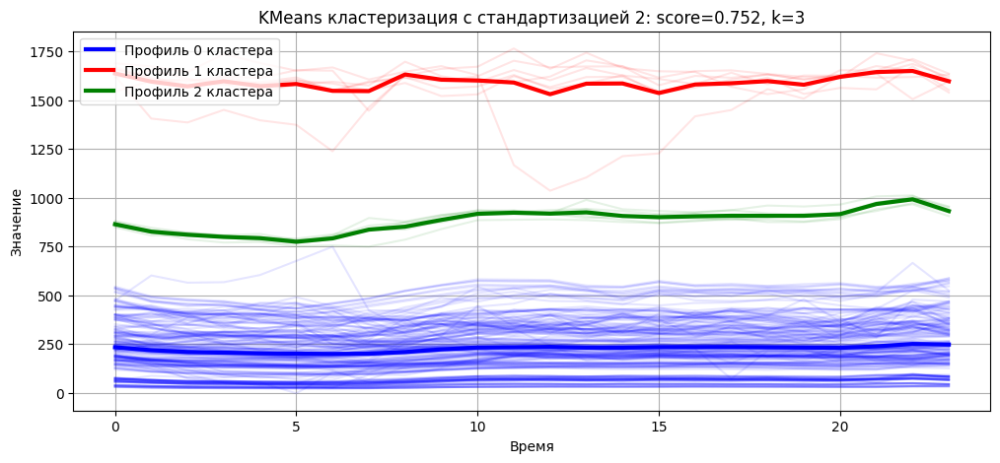

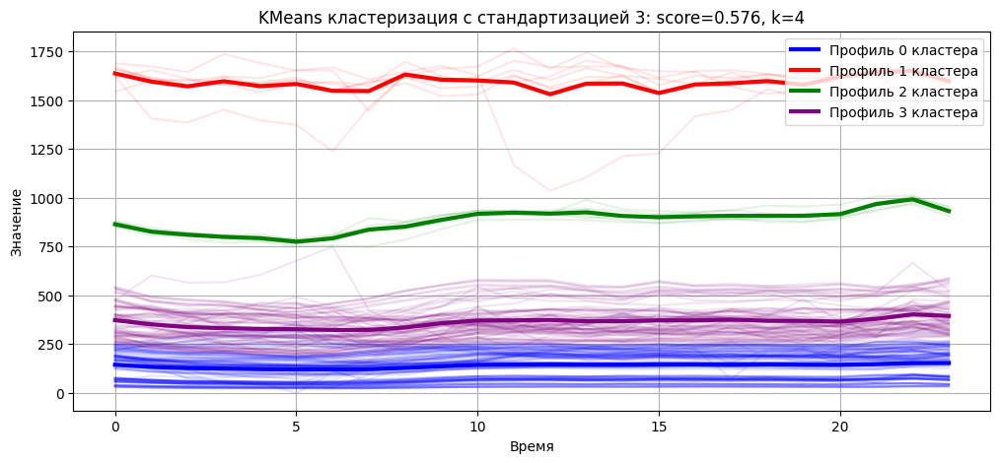

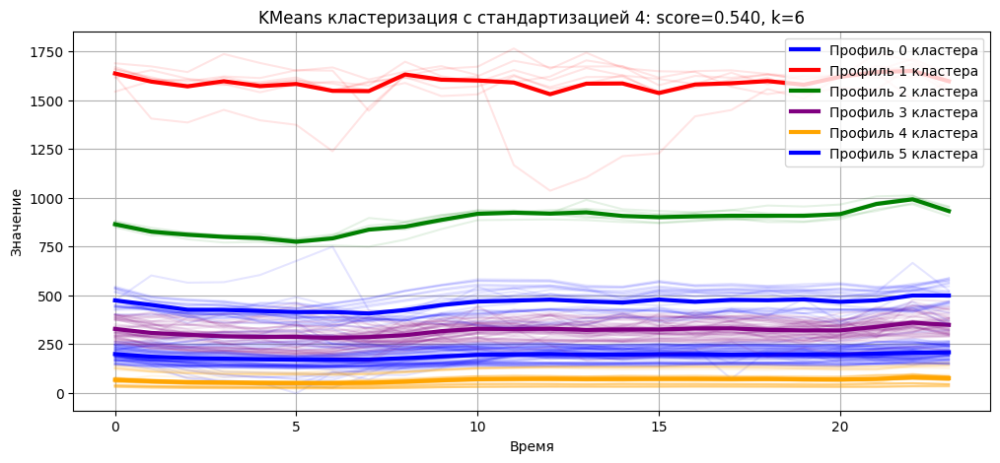

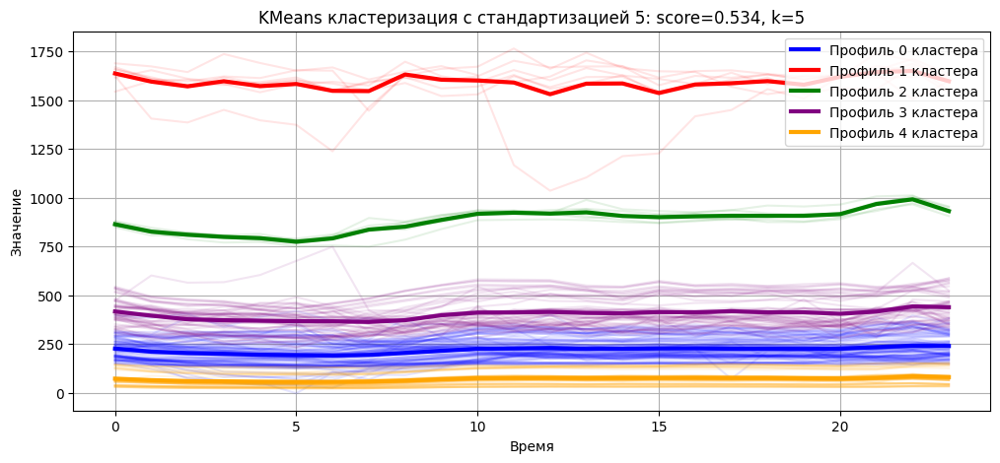

,params,silhouette,cluster_0_size,cluster_1_size,cluster_2_size,cluster_3_size,cluster_4_size,cluster_5_size
0,k=2,0.846934,203,7,NaN,NaN,NaN,NaN
1,k=3,0.751903,196,7,7.0,NaN,NaN,NaN
2,k=4,0.576150,119,7,7.0,77.0,NaN,NaN
3,k=6,0.539703,71,7,7.0,52.0,49.0,24.0
4,k=5,0.534047,93,7,7.0,50.0,53.0,NaN


In [23]:
from sklearn.cluster import KMeans

results_kmeans = []
k_list = [2, 3, 4, 5, 6]

for k in k_list:
    model = KMeans(n_clusters=k, random_state=0)
    labels = model.fit_predict(X_scaled)

    score = silhouette_score(X_scaled, labels)
    results_kmeans.append((score, k, labels))

results_kmeans_sorted = sorted(results_kmeans, key=lambda x: -x[0])

rows = []

for score, k, labels in results_kmeans_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{u}_size": int(c) for u, c in zip(unique, counts)}

    row = {
        "params": f"k={k}",
        "silhouette": score
    }
    row.update(count_dict)

    rows.append(row)

df_kmeans = pd.DataFrame(rows)

for i, (score, k, labels) in enumerate(results_kmeans_sorted[:5]):
    title = f"KMeans кластеризация с стандартизацией {i+1}: score={score:.3f}, k={k}"
    plot_ts_clusters_on_one_figure(X, labels, title)

df_kmeans.head(5)


KMeans:
- Стандартизация поменяла кластеризацию с K = 2.
- Силуэт падает с увеличением количества классов, что закономерно: кластеры становятся плотнее и меньше, сильнее перекрываются, объекты из разных кластеров оказываются слишком близко друг к другу, уменьшается различимость групп.
- Однако кластеризация с большим количеством классов более информативна.

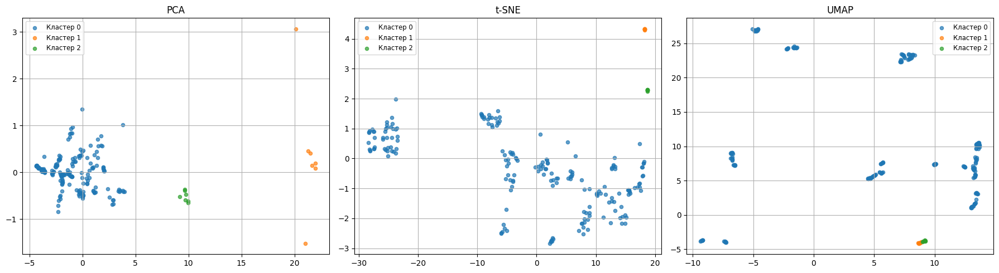

In [24]:
chosen_index = 2
i = chosen_index - 1
score, k, chosen_labels  = results_kmeans_sorted[i]
chosen_meta = {"method": "KMeans", "score": score, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels })

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()

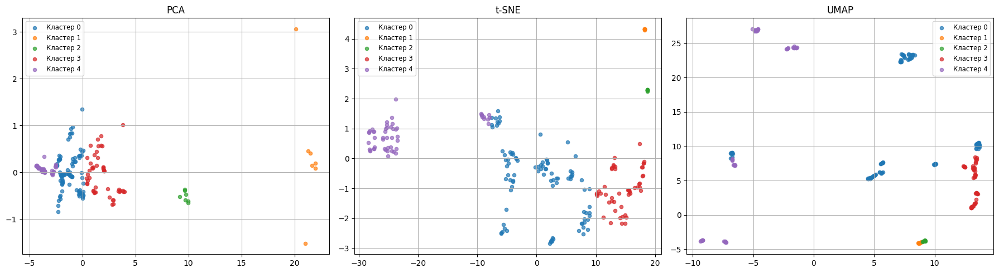

In [27]:
chosen_index = 5
i = chosen_index - 1
score, k, chosen_labels  = results_kmeans_sorted[i]
chosen_meta = {"method": "KMeans", "score": score, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels })

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()

DBSCAN

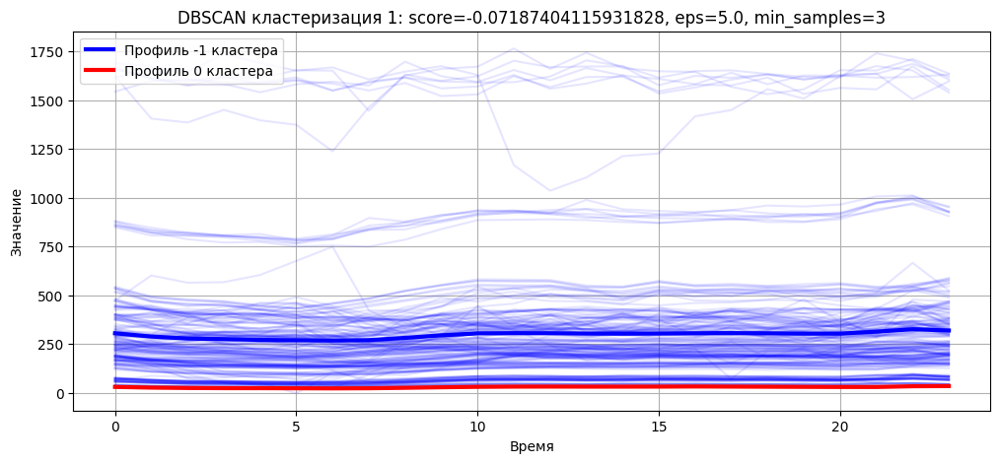

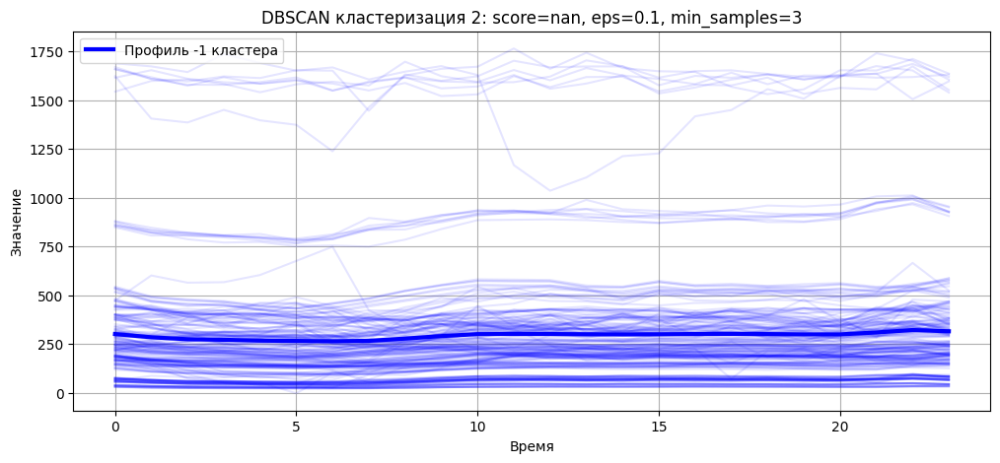

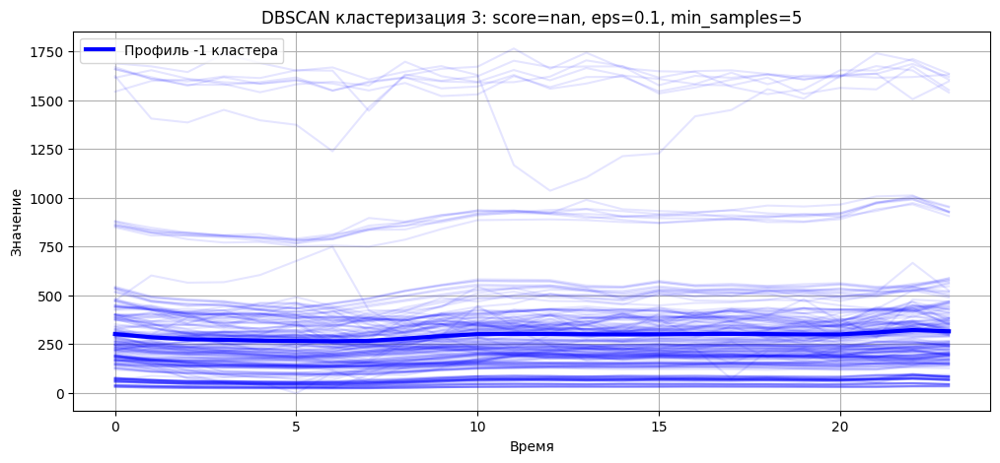

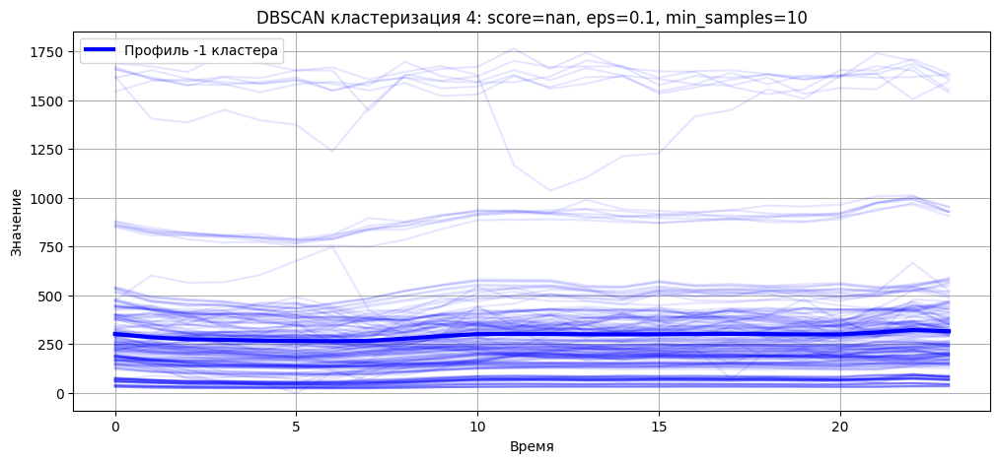

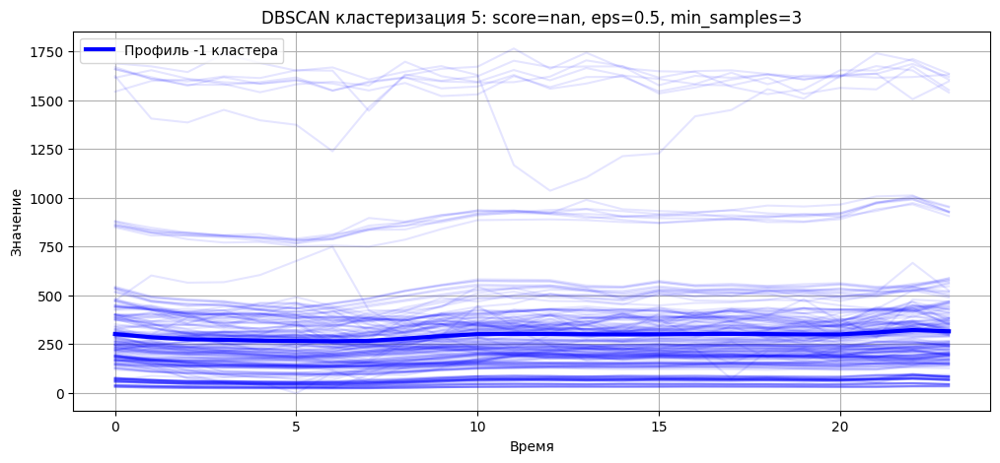

,params,silhouette,cluster_-1_size,cluster_0_size
0,"eps=5.0, min_samples=3",-0.071874,207,3.0
1,"eps=0.1, min_samples=3",NaN,210,NaN
2,"eps=0.1, min_samples=5",NaN,210,NaN
3,"eps=0.1, min_samples=10",NaN,210,NaN
4,"eps=0.5, min_samples=3",NaN,210,NaN


In [28]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

results_db = []

eps_list = [0.1, 0.5, 1.0, 2.0, 5.0]
min_samples_list = [3, 5, 10]

for eps in eps_list:
    for ms in min_samples_list:
        model = DBSCAN(eps=eps, min_samples=ms)
        labels = model.fit_predict(X)
        
        try:
            score = silhouette_score(X, labels)
        except:
            score = np.nan

        results_db.append((score, eps, ms, labels))

results_db_sorted = sorted(
    results_db,
    key=lambda x: (-np.nan_to_num(x[0], nan=-9999))
)

rows = []

for score, eps, ms, labels in results_db_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{u}_size": int(c) for u, c in zip(unique, counts)}

    row = {
        "params": f"eps={eps}, min_samples={ms}",
        "silhouette": score
    }
    row.update(count_dict)
    rows.append(row)

df_dbscan = pd.DataFrame(rows)

# Визуализация ТОП-5
for i, (score, eps, ms, labels) in enumerate(results_db_sorted[:5]):
    title = f"DBSCAN кластеризация {i+1}: score={score}, eps={eps}, min_samples={ms}"
    plot_ts_clusters_on_one_figure(X, labels, title)

df_dbscan.head(5)


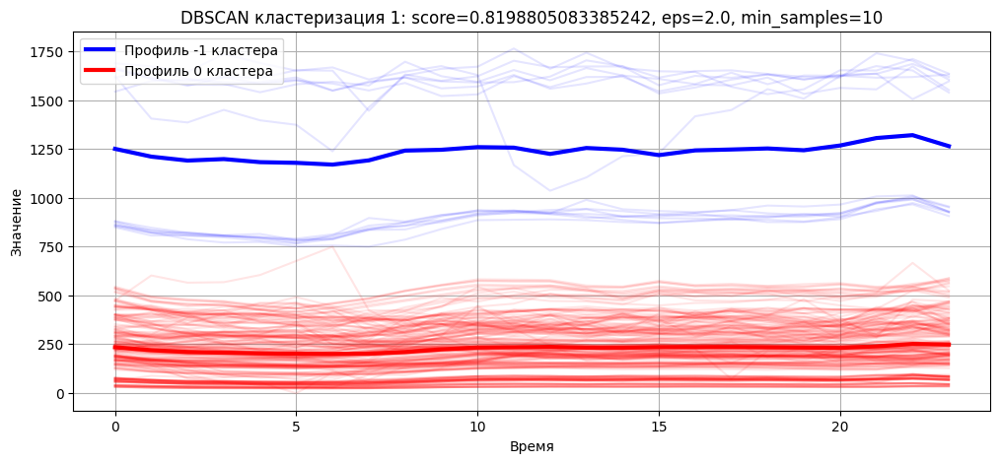

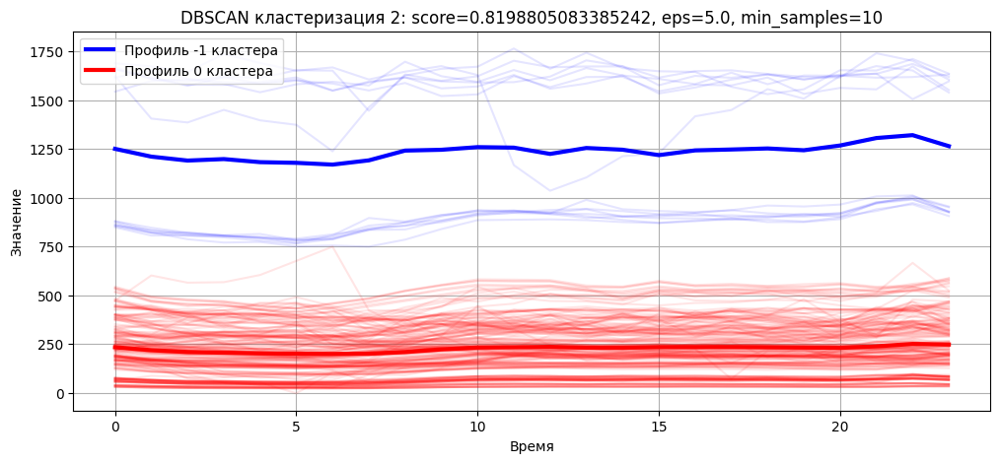

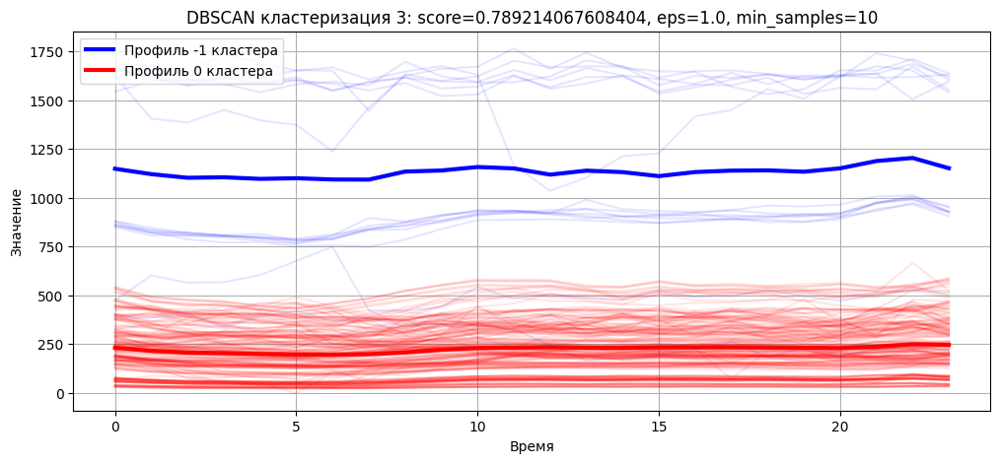

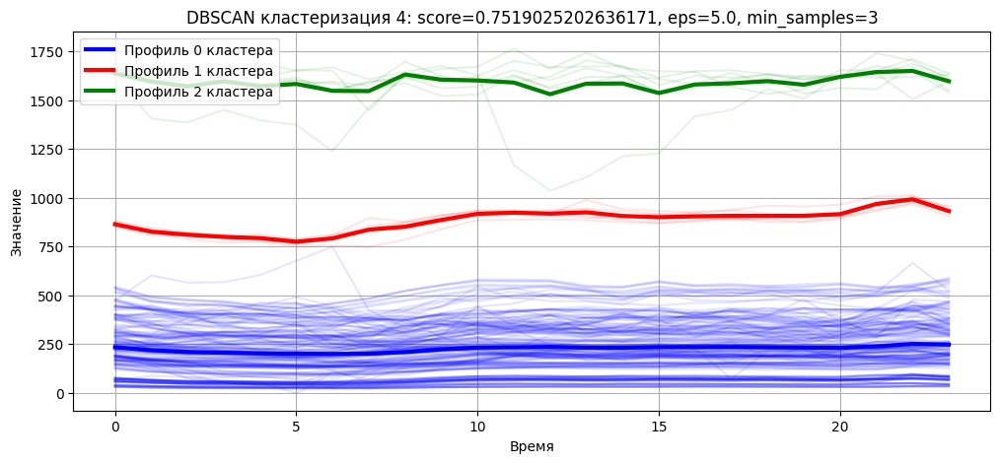

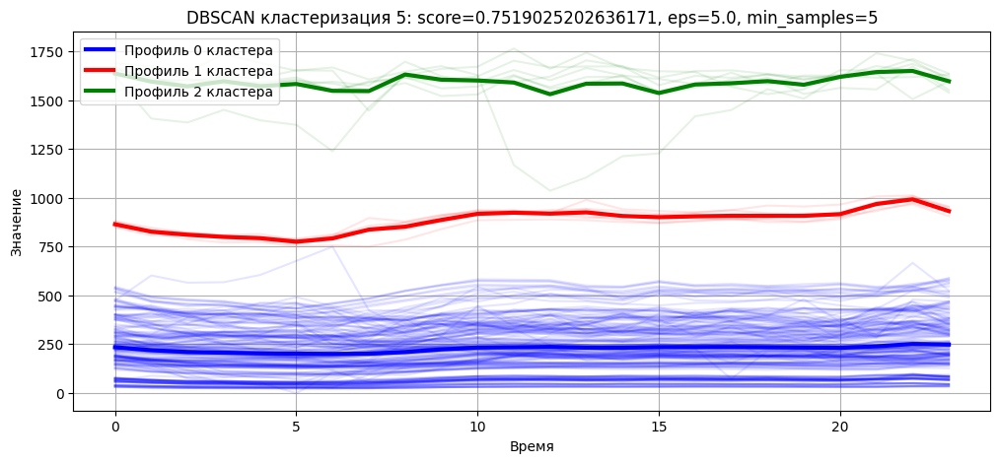

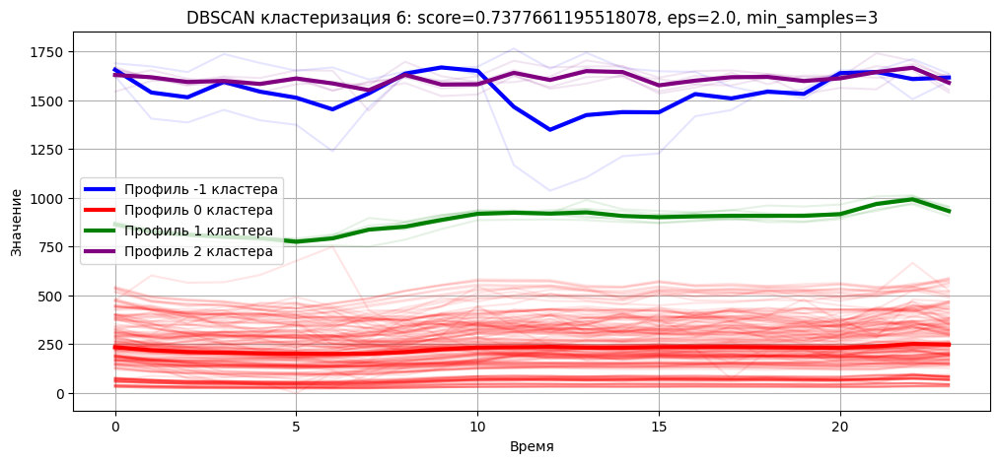

,params,silhouette,cluster_-1_size,cluster_0_size,cluster_1_size,cluster_2_size,cluster_3_size,cluster_4_size,cluster_5_size,cluster_6_size,cluster_7_size,cluster_8_size,cluster_9_size,cluster_10_size,cluster_11_size,cluster_12_size
0,"eps=2.0, min_samples=10",0.819881,14.0,196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"eps=5.0, min_samples=10",0.819881,14.0,196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"eps=1.0, min_samples=10",0.789214,16.0,194,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"eps=5.0, min_samples=3",0.751903,NaN,196,7.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"eps=5.0, min_samples=5",0.751903,NaN,196,7.0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"eps=2.0, min_samples=3",0.737766,2.0,196,7.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
import numpy as np
import pandas as pd

results_db = []

eps_list = [0.1, 0.5, 1.0, 2.0, 5.0]
min_samples_list = [3, 5, 10]

for eps in eps_list:
    for ms in min_samples_list:
        model = DBSCAN(eps=eps, min_samples=ms)
        labels = model.fit_predict(X_scaled)
        
        try:
            score = silhouette_score(X_scaled, labels)
        except:
            score = np.nan

        results_db.append((score, eps, ms, labels))

results_db_sorted = sorted(
    results_db,
    key=lambda x: (-np.nan_to_num(x[0], nan=-9999))
)

rows = []

for score, eps, ms, labels in results_db_sorted:
    unique, counts = np.unique(labels, return_counts=True)
    count_dict = {f"cluster_{u}_size": int(c) for u, c in zip(unique, counts)}

    row = {
        "params": f"eps={eps}, min_samples={ms}",
        "silhouette": score
    }
    row.update(count_dict)
    rows.append(row)

df_dbscan = pd.DataFrame(rows)

for i, (score, eps, ms, labels) in enumerate(results_db_sorted[:6]):
    title = f"DBSCAN кластеризация {i+1}: score={score}, eps={eps}, min_samples={ms}"
    plot_ts_clusters_on_one_figure(X, labels, title)

df_dbscan.head(6)


DBSCAN:
- До стандартизации не сработал: выделял 1 класс и шум. Параметр eps «не понимает» реальные расстояния без стандартизации.
- Не обнаружил 6 кластеров, как KMeans или иерархическая. 

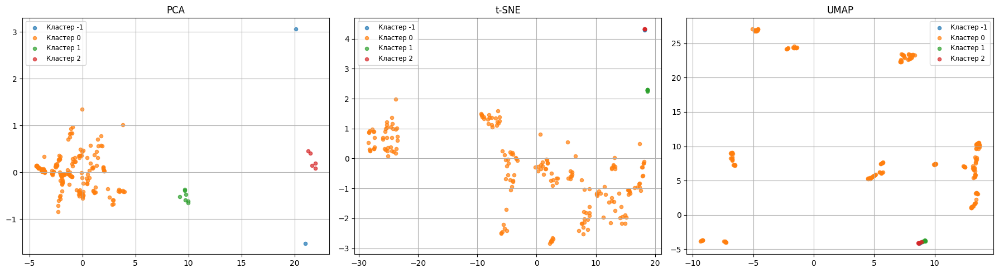

In [40]:
chosen_index = 6
i = chosen_index - 1
score, eps, ms, chosen_labels  = results_db_sorted[i]
chosen_meta = {"method": "DBSCAN", "score": score, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels })

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()

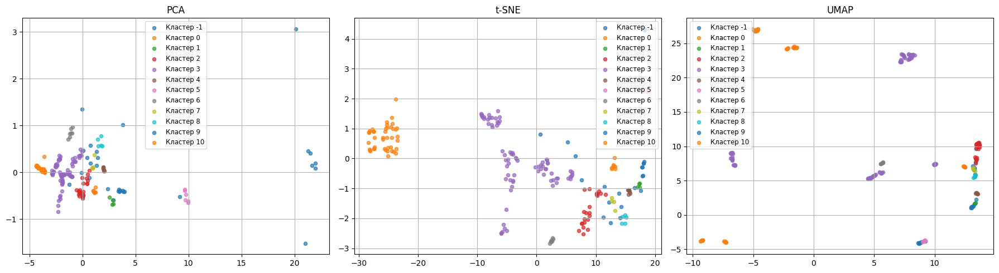

In [41]:
chosen_index = 10
i = chosen_index - 1
score, eps, ms, chosen_labels  = results_db_sorted[i]
chosen_meta = {"method": "DBSCAN", "score": score, "k": k}
df_labels = pd.DataFrame({"cluster": chosen_labels })

# PCA
pca = PCA(n_components=2, random_state=0)
X_pca = pca.fit_transform(X_scaled)

# t-SNE
tsne = TSNE(n_components=2, random_state=0, init="pca", learning_rate="auto")
X_tsne = tsne.fit_transform(X_scaled)

# UMAP
reducer = umap.UMAP(n_components=2, random_state=0)
X_umap = reducer.fit_transform(X_scaled)


def plot_2d_scatter(points2d, labels, title="2D проекция данных", ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(7,5))
    unique = np.unique(labels)
    cmap = plt.get_cmap("tab10")
    for i, lab in enumerate(unique):
        mask = (labels == lab)
        ax.scatter(points2d[mask, 0], points2d[mask, 1], s=20, color=cmap(i % 10), alpha=0.7, label=f"Кластер {lab}")
    ax.set_title(title)
    ax.legend(loc="best", fontsize="small")
    ax.grid(True)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

plot_2d_scatter(X_pca, chosen_labels, title=f"PCA", ax=axs[0])
plot_2d_scatter(X_tsne, chosen_labels, title="t-SNE", ax=axs[1])
plot_2d_scatter(X_umap, chosen_labels, title="UMAP", ax=axs[2])

plt.tight_layout()
plt.show()

Глобальные выводы:
- Иерархическая и KMeans находят глобальные структуры (крупные, удалённые кластеры). По качеству визуального разделения групп в проекциях (PCA, t-SNE, UMAP) эти методы дали наиболее интерпретируемые кластеры.
- DBSCAN находит локальные плотности (локально плотные группы).
- Высокий silhouette не гарантирует информативность в проекциях.
- По качеству визуального разделения групп в проекциях (PCA, t-SNE, UMAP) KMeans дал наиболее интерпретируемые кластеры.